## Processamento de imagem 5 - Contrastes

## Exemplo 1

In [6]:
# Impotação das bibliotecas

import cv2
from google.colab.patches import cv2_imshow

from matplotlib import pyplot as plt

from google.colab import files
uploaded = files.upload()

Saving entrada.png to entrada.png
Saving entrada_2.jpg to entrada_2.jpg
Saving entrada_3.jpg to entrada_3.jpg
Saving entrada_4.jpg to entrada_4.jpg
Saving entrada_5.jpg to entrada_5.jpg
Saving entrada_6.jpg to entrada_6.jpg
Saving entrada_7.jpg to entrada_7.jpg
Saving entrada_8.jpg to entrada_8.jpg
Saving entrada_9.jpg to entrada_9.jpg


In [7]:
# Leitura da imagem com a função imread()

imagem = cv2.imread('entrada_6.jpg')

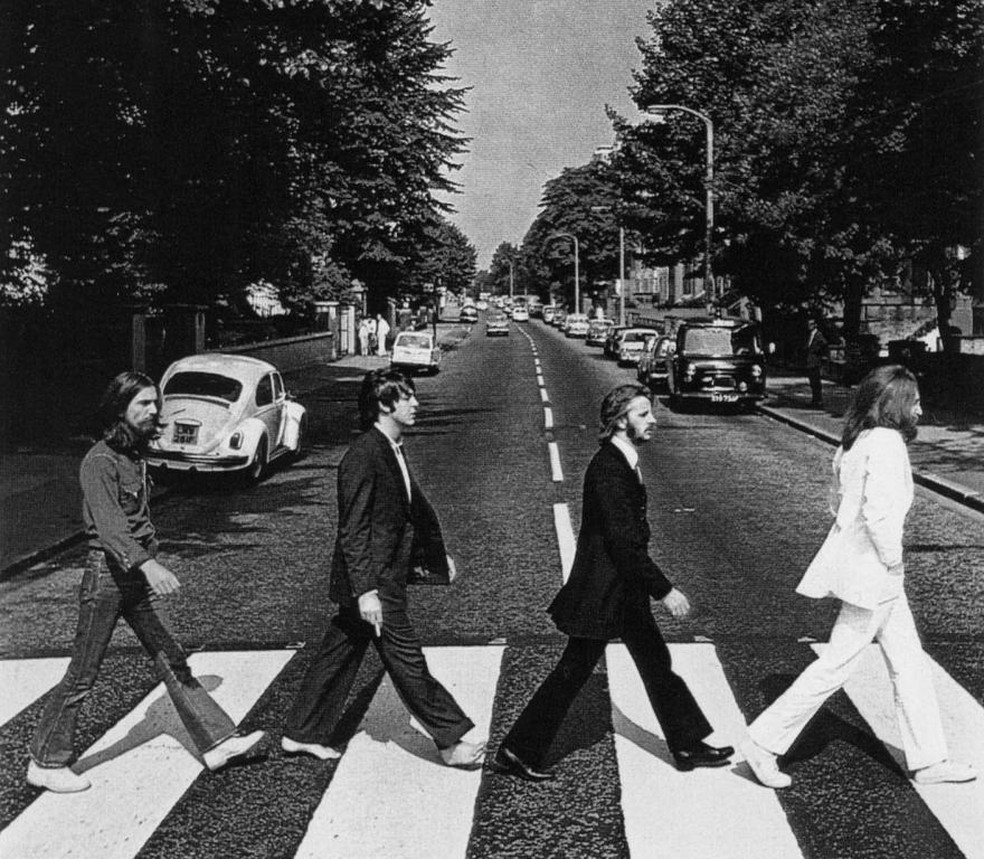

In [8]:
# Escala de cinza

gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

In [9]:
# Função calcHist para calcular o histograma da imagem

h = cv2.calcHist([gray], [0], None, [256], [0, 256])

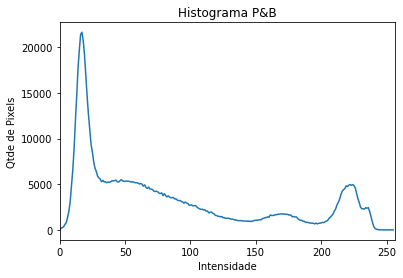

In [10]:
# Definições do histograma

plt.figure()
plt.title("Histograma P&B")
plt.xlabel("Intensidade")
plt.ylabel("Qtde de Pixels")
plt.plot(h)
plt.xlim([0, 256])
plt.show()

# Exemplo 2

In [11]:
import cv2
from google.colab.patches import cv2_imshow

from matplotlib import pyplot as plt

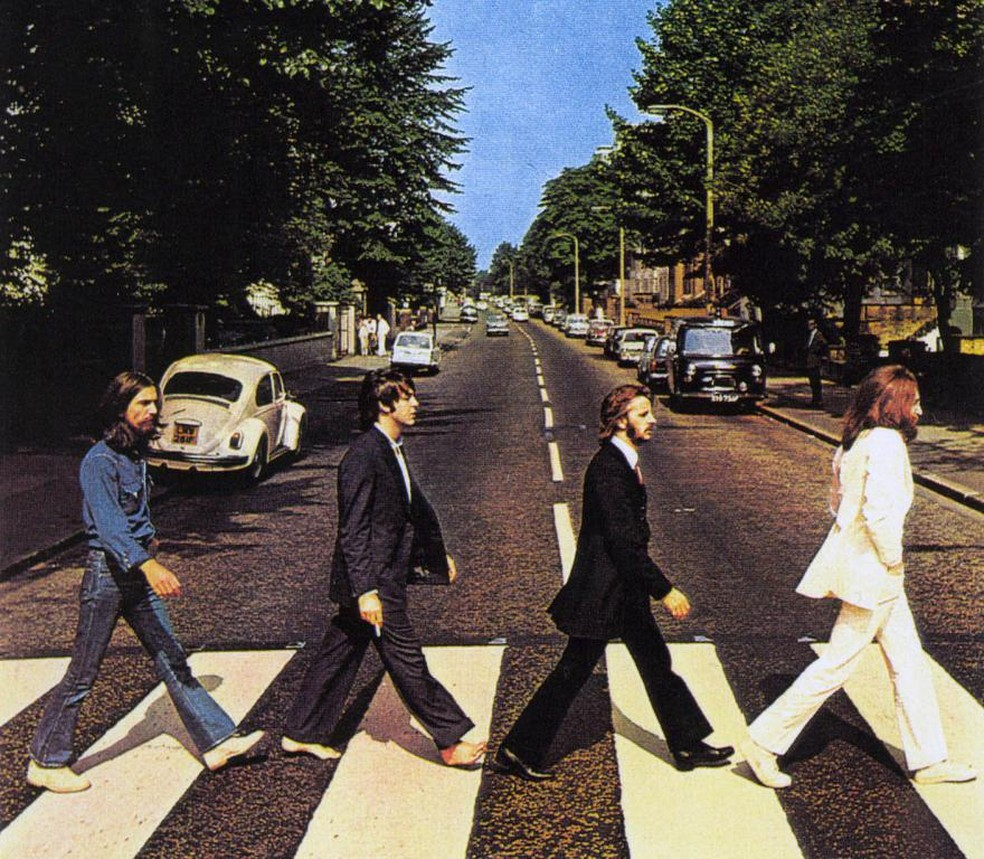

In [12]:
# Leitura da imagem com a função imread()

imagem = cv2.imread('entrada_6.jpg')
cv2_imshow(imagem)

Text(0, 0.5, 'Número de Pixels')

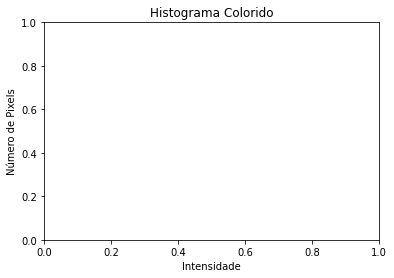

In [14]:
# Separa os canais

canais = cv2.split(imagem)
cores = ("b","g","r")

plt.figure()
plt.title("Histograma Colorido")
plt.xlabel("Intensidade")
plt.ylabel("Número de Pixels")

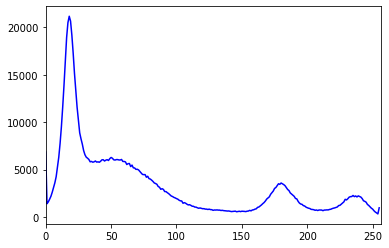

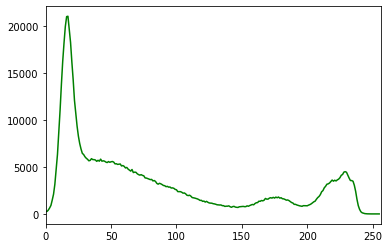

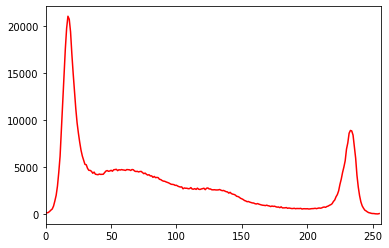

In [16]:
# Este loop executa 3 vezes, uma para cada canal

for (canal, cor) in zip(canais, cores):
  hist = cv2.calcHist([canal], [0], None, [256], [0, 256])
  plt.plot(hist, color = cor)
  plt.xlim([0, 256])

  plt.show()

## Exemplo 3

In [19]:
import cv2
from google.colab.patches import cv2_imshow

import numpy as np

In [20]:
imagem = cv2.imread('entrada_7.jpg')

In [21]:
# Diminui a imagem

img = imagem[::2,::2]

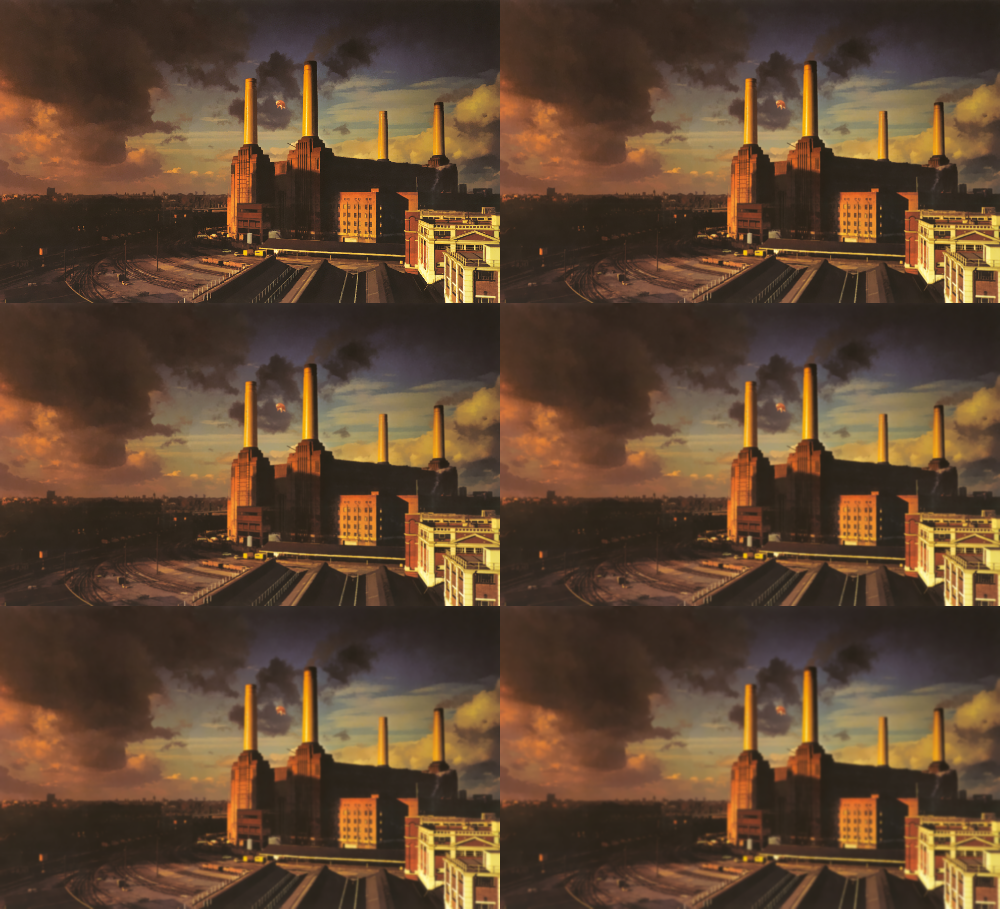

In [28]:
# Função vstack (pilha vertical) e hstack (pilha horizontal)
# juntar as imagens em uma única imagem final mostrando desde a imagem original e
# seguinte com caixas de calculo de 3x3, 5x5, 7x7, 9x9 e 11x11

# dessa forma uma I.A por exemplo, consegue detectar quais são os objetos da cena

suave = np.vstack([
  np.hstack([img, cv2.GaussianBlur(img, (3,3), 0)]),
  np.hstack([cv2.GaussianBlur(img, (5,5), 0), cv2.GaussianBlur(img, (7,7), 0)]),
  np.hstack([cv2.GaussianBlur(img, (9,9), 0), cv2.GaussianBlur(img, (11,11), 0)]),
])

cv2_imshow(suave)

## Processamento de imagem 6 - Binarização

## Exemplo 1

In [35]:
import cv2
from google.colab.patches import cv2_imshow

import numpy as np

In [36]:
imagem = cv2.imread('entrada_8.jpg')

In [37]:
# Aplica P&B

img = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

# Aplica blur

suave = cv2.GaussianBlur(img, (7,7), 0)

In [38]:
# Convertemos imagens em tons de cinza para imagens preto e branco
# onde todos os pixels possuem 0 ou 255 como valores de intensidade

(T, bin) = cv2.threshold(suave, 160, 255, cv2.THRESH_BINARY)
(T, binI) = cv2.threshold(suave, 160, 255, cv2.THRESH_BINARY_INV)

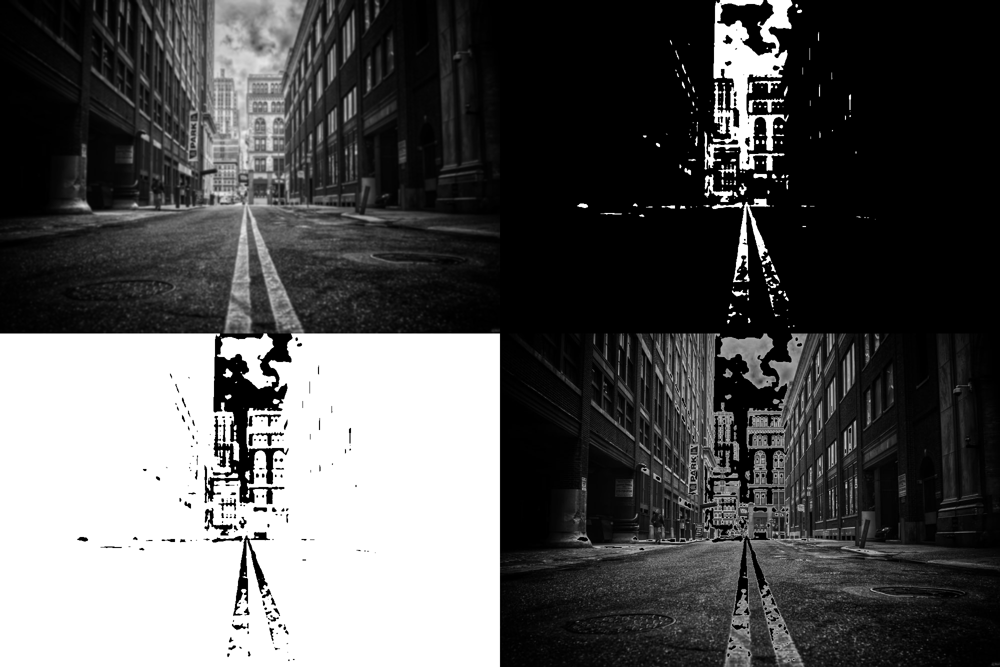

In [39]:
resultado = np.vstack([
  np.hstack([suave, bin]),
  np.hstack([binI, cv2.bitwise_and(img, img, mask = binI)]),
])

cv2_imshow(resultado)

## Exemplo 2

In [40]:
import cv2
from google.colab.patches import cv2_imshow

import numpy as np

In [42]:
!pip install mahotas
import mahotas

     |████████████████████████████████| 5.7MB 4.4MB/s 


In [43]:
imagem = cv2.imread('entrada_8.jpg')

# Aplica P&B

img = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

# Aplica blur

suave = cv2.GaussianBlur(img, (7,7), 0)

In [45]:
# Método que automaticamente encontra um threshold para a imagem,
# neste caso ele analiza o histograma da imagem para encontrar os dois
# maiores picos de intensidade, então ele calcula um valor
# para separar da melhor forma esses dois picos.

T = mahotas.thresholding.otsu(suave)
temp = img.copy()
temp[temp > T] = 255
temp[temp < 255] = 0
temp = cv2.bitwise_not(temp)

In [46]:
T = mahotas.thresholding.rc(suave)
temp2 = img.copy()
temp2[temp2 > T] = 255
temp2[temp2 < 255] = 0
temp2 = cv2.bitwise_not(temp2) # "bitwise_not" vai aplicar uma máscara inversa

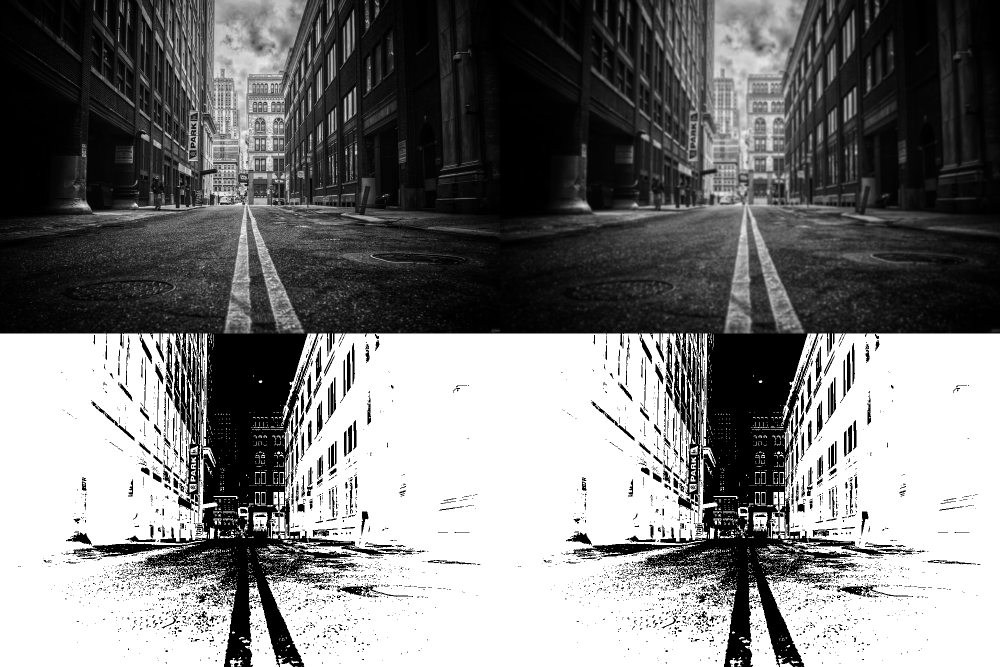

In [50]:
resultado = np.vstack([
  np.hstack([img, suave]),
  np.hstack([temp, temp2])
])

cv2_imshow(resultado)

## Exemplo 3

In [54]:
import cv2
from google.colab.patches import cv2_imshow

import numpy as np

In [61]:
imagem = cv2.imread('entrada_9.jpg')

# Aplica P&B

img = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

In [62]:
# Técnica de contorno
# Detecção de bordas se fas através de identificação do gradiente (Passe Alta), ou,
# neste caso, de variações abruptas na intensidade dos pixels de uma regição da imagem

sobelX = cv2.Sobel(img, cv2.CV_64F, 1, 0)
sobelY = cv2.Sobel(img, cv2.CV_64F, 0, 1)

sobelX = np.uint8(np.absolute(sobelX))
sobelY = np.uint8(np.absolute(sobelY))

sobel = cv2.bitwise_or(sobelX, sobelY)

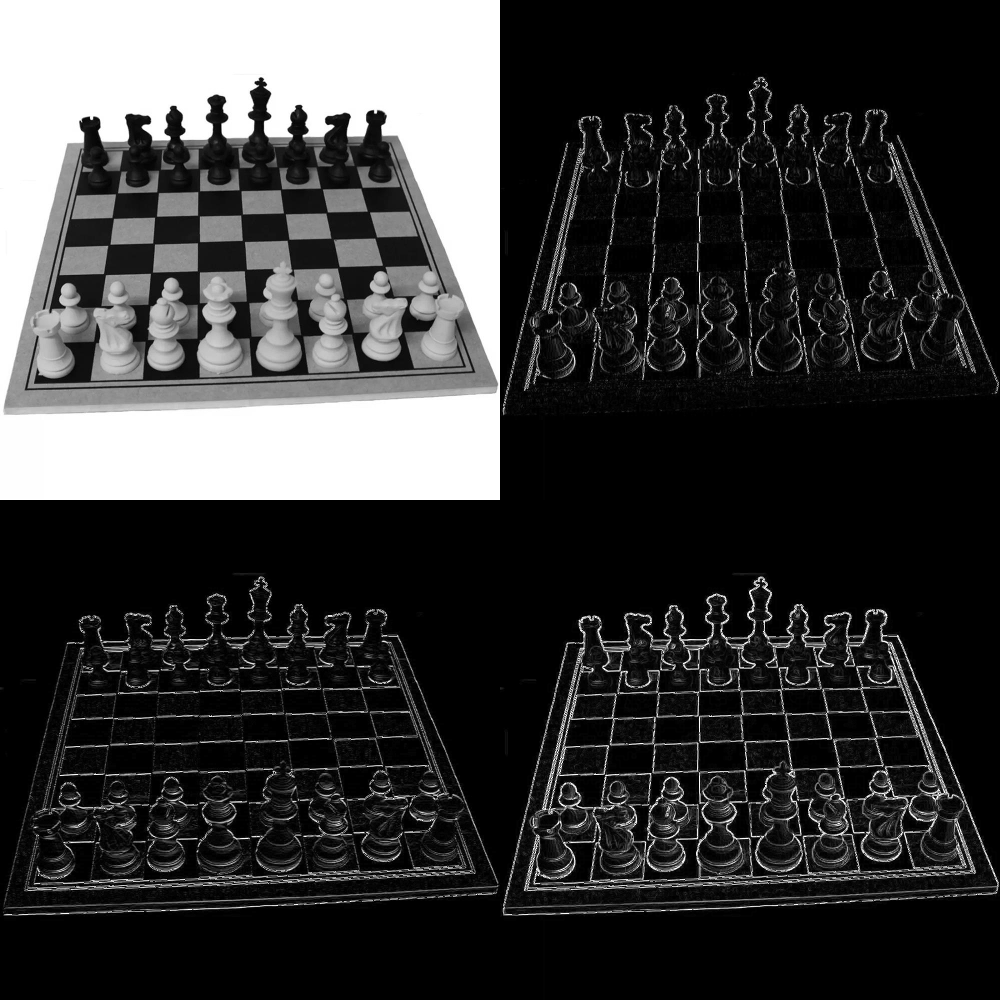

In [63]:
resultado = np.vstack([
  np.hstack([img, sobelX]),
  np.hstack([sobelY, sobel])
])

cv2_imshow(resultado)

## Exemplo 4

In [64]:
import cv2
from google.colab.patches import cv2_imshow

import numpy as np

In [65]:
imagem = cv2.imread('entrada_9.jpg')

img = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

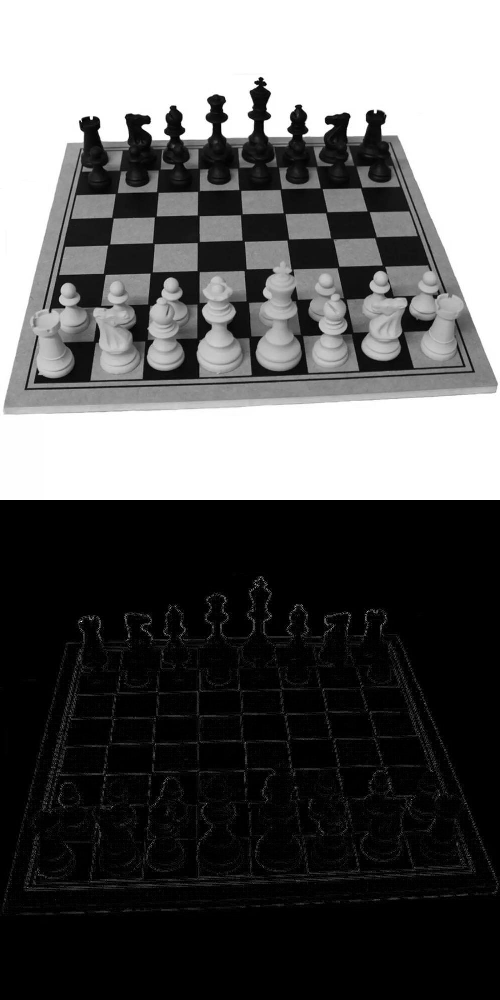

In [66]:
# Filtro passa Alta Laplaciano

lap = cv2.Laplacian(img, cv2.CV_64F)
lap = np.uint8(np.absolute(lap))

resultado = np.vstack([img, lap])

cv2_imshow(resultado)